# Cascadia Margin Lipid Modeling


In [1]:
from os.path import join
import pandas as pd
import numpy as np

In [2]:
import matplotlib.pyplot as plt

In [3]:
import pymc as pm
import arviz as az

WARNING (pytensor.tensor.blas): Using NumPy C-API based implementation for BLAS functions.


## configuration


In [4]:
from matplotlib import style

In [5]:
style.use(join("..", "style.mplstyle"))
datadir = join("..", "data", "processed")

## load data


### relative abundance and d13C of GDGT compounds


In [6]:
df = pd.read_excel(join(datadir, "CascadiaMargin_carbon_abundance.xlsx"))
df.replace(
    {"Astoria Cyn": "Astoria Canyon", "Mcarthur cyn": "Mcarthur Canyon"}, inplace=True
)
df.sample(10)

,Sample Name,Location,Compound,m_from_plume,depth_int,avg_ugC,F2/F1,d13c_avg,stdev,purity_score,rel_abund
13,S3,Astoria Canyon,G5,20.0,2-3,NaN,NaN,NaN,NaN,NaN,0.004054
9,S3,Astoria Canyon,G1,20.0,2-3,NaN,NaN,NaN,NaN,NaN,0.118678
115,S61,Hydrate Ridge,G2,60.0,0-1,1.243272,9.846008,-68.548893,0.482025,0.835416,0.073511
11,S3,Astoria Canyon,G3,20.0,2-3,NaN,NaN,NaN,NaN,NaN,0.020541
32,S7,Astoria Canyon,G3,0.0,0-1,NaN,NaN,NaN,NaN,NaN,0.056481
157,S76,Hydrate Ridge,G2,30.0,3-4,1.381978,16.322268,-60.686060,0.288011,0.868784,0.061426
199,S101,Mcarthur Canyon,G2,30.0,4-6,1.573379,7.708301,-21.461305,0.130195,0.796973,0.039425
168,S93,Mcarthur Canyon,Cren,15.0,2-3,5.850814,20.347368,-19.052799,0.077994,0.914486,0.433165
212,S105,Mcarthur Canyon,G1,60.0,2-3,NaN,NaN,NaN,NaN,NaN,0.067871
149,S75,Hydrate Ridge,G1,30.0,2-3,1.471020,13.307908,-35.274648,0.096372,0.804409,0.077793


## Modeling


### data setup


unified table


In [7]:
data = df[["Sample Name", "Location", "Compound", "d13c_avg", "rel_abund"]]
data = data.pivot(columns="Compound", index=["Location", "Sample Name"])
data.head()

d13c_avg                                      \
Compound                       Cren     G0     G1     G2     G3  G4  G5   
Location       Sample Name                                                
Astoria Canyon S1            -22.73 -30.91    NaN -83.71    NaN NaN NaN   
               S10           -31.55 -35.05 -78.34 -91.61    NaN NaN NaN   
               S11           -36.44 -36.78 -84.06 -96.46 -94.52 NaN NaN   
               S3               NaN    NaN    NaN    NaN    NaN NaN NaN   
               S4            -23.87 -48.29    NaN -85.14    NaN NaN NaN   

                           rel_abund                                          \
Compound                        Cren        G0        G1        G2        G3   
Location       Sample Name                                                     
Astoria Canyon S1           0.306266  0.389506  0.097763  0.157369  0.042605   
               S10          0.190468  0.272736  0.108790  0.270738  0.134849   
               S11          0.151434  0.251405  0.116905  0.282700  0.168619   
               S3           0.287896  0.428023  0.118678  0.137595  0.020541   
               S4           0.219767  0.481303  0.112187  0.158765  0.021725   

                                                
Compound                          G4        G5  
Location       Sample Name                      
Astoria Canyon S1           0.000274  0.006217  
               S10          0.019270  0.003149  
               S11          0.026520  0.002418  
               S3           0.003213  0.004054  
               S4           0.003057  0.003197

relative abundance table


In [8]:
relative_abundance = data["rel_abund"]
relative_abundance.sample(5)

Compound                         Cren        G0        G1        G2        G3  \
Location        Sample Name                                                     
Hydrate Ridge   S65          0.340033  0.483544  0.076105  0.063907  0.004671   
Mcarthur Canyon S111         0.400500  0.463710  0.073831  0.042330  0.004932   
Hydrate Ridge   S41          0.331753  0.473597  0.088075  0.078350  0.007196   
Astoria Canyon  S7           0.292885  0.416644  0.092921  0.127931  0.056481   
                S3           0.287896  0.428023  0.118678  0.137595  0.020541   

Compound                           G4        G5  
Location        Sample Name                      
Hydrate Ridge   S65          0.000505  0.031235  
Mcarthur Canyon S111         0.004004  0.010693  
Hydrate Ridge   S41          0.000218  0.020811  
Astoria Canyon  S7           0.008502  0.004636  
                S3           0.003213  0.004054

In [9]:
assert all(np.isclose(relative_abundance.sum(axis=1).values, 1, rtol=1e-3))

In [10]:
relative_abundance.groupby(level=0).agg(["mean", "std"])

Compound             Cren                  G0                  G1            \
                     mean       std      mean       std      mean       std   
Location                                                                      
Astoria Canyon   0.224675  0.064108  0.372260  0.085086  0.114038  0.019510   
Hydrate Ridge    0.347166  0.054203  0.445774  0.027209  0.087188  0.022635   
Mcarthur Canyon  0.414621  0.012682  0.456807  0.013816  0.068277  0.004401   

Compound               G2                  G3                  G4            \
                     mean       std      mean       std      mean       std   
Location                                                                      
Astoria Canyon   0.201362  0.062735  0.074112  0.057568  0.009839  0.009523   
Hydrate Ridge    0.084476  0.048461  0.007215  0.005428  0.000537  0.000520   
Mcarthur Canyon  0.040846  0.004993  0.004700  0.000727  0.002830  0.001351   

Compound               G5            
                     mean       std  
Location                             
Astoria Canyon   0.003715  0.001278  
Hydrate Ridge    0.027645  0.014273  
Mcarthur Canyon  0.011918  0.001281

carbon isotopic fractionation table


In [11]:
d13C = data["d13c_avg"]
d13C.sample(5)

Compound                          Cren         G0         G1         G2  \
Location        Sample Name                                               
Mcarthur Canyon S111        -18.887849 -20.921446        NaN        NaN   
                S112        -18.975433 -21.091221        NaN        NaN   
Hydrate Ridge   S40         -20.105672 -26.188417 -51.364505 -76.881724   
Astoria Canyon  S9          -28.980000 -34.270000        NaN -92.520000   
Hydrate Ridge   S39         -19.791236 -26.681803 -53.711971 -67.926304   

Compound                        G3  G4  G5  
Location        Sample Name                 
Mcarthur Canyon S111           NaN NaN NaN  
                S112           NaN NaN NaN  
Hydrate Ridge   S40            NaN NaN NaN  
Astoria Canyon  S9          -89.81 NaN NaN  
Hydrate Ridge   S39            NaN NaN NaN

In [12]:
d13C.groupby(level=0).agg(["mean", "std"])

Compound              Cren                   G0                    G1  \
                      mean       std       mean        std       mean   
Location                                                                
Astoria Canyon  -27.500000  5.117011 -39.252857  12.583389 -78.583333   
Hydrate Ridge   -20.112818  1.751414 -25.830361  10.365047 -46.454807   
Mcarthur Canyon -18.948287  0.170264 -19.934959   0.935452 -22.907023   

Compound                           G2                 G3             G4      \
                       std       mean        std    mean       std mean std   
Location                                                                      
Astoria Canyon    5.359145 -89.108571   5.778086 -92.165  3.330473  NaN NaN   
Hydrate Ridge    15.803619 -68.493641  15.006748     NaN       NaN  NaN NaN   
Mcarthur Canyon   5.434851 -28.755275  13.681861     NaN       NaN  NaN NaN   

Compound          G5      
                mean std  
Location                  
Astoria Canyon   NaN NaN  
Hydrate Ridge    NaN NaN  
Mcarthur Canyon  NaN NaN

In [13]:
d13C.groupby(level=0).apply(lambda sl: sl.notnull().sum() / len(sl))

Compound,Cren,G0,G1,G2,G3,G4,G5
Location,,,,,,,
Astoria Canyon,0.875,0.875,0.375000,0.875000,0.25,0.0,0.0
Hydrate Ridge,1.000,1.000,1.000000,1.000000,0.00,0.0,0.0
Mcarthur Canyon,1.000,1.000,0.230769,0.230769,0.00,0.0,0.0


the order of the compounds and the lengths of different dimensions


In [14]:
GDGTs = ["G0", "G1", "G2", "G3", "G4", "Cren", "G5"]  # careful with the ordering here
nchem = len(GDGTs)
communities = [
    "planktonic",
    "benthic-methane cycling",
    "benthic-non-methane cycling",
]
ncom = len(communities)
locations = data.index.levels[0]
nloc = len(locations)
locations

Index(['Astoria Canyon', 'Hydrate Ridge', 'Mcarthur Canyon'], dtype='object', name='Location')

ranges for the proportions of the compounds produced by each community, which go into the priors for `X`


In [15]:
X_lo = np.array(
    [
        [0.2, 0.0, 0.0, 0.0, 0.0, 0.2, 0.0],
        [0.2, 0.05, 0.2, 0.05, 0.0, 0.0, 0.0],
        [0.1, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0],
    ]
)
X_hi = np.array(
    [
        [0.8, 0.2, 0.1, 0.05, 1e-2, 0.5, 0.05],
        [0.5, 0.2, 0.5, 0.2, 0.1, 1e-2, 1e-2],
        [0.5, 0.3, 0.3, 0.3, 0.3, 1e-2, 0.1],
    ]
)

ranges for the dC13 values produced by each community, informing the priors for `D`


In [16]:
D_lo = np.array([-22, -120, -30])
D_hi = np.array([-18, -40, -22])

### model definition


In [17]:
# this depends on the ordering of the inputs, as defined above
def methane_index(A):
    # G1, G2, G3
    num = pm.math.sum(A[:, 1:4], axis=1, keepdims=True)
    # G1, G2, G3
    den = pm.math.sum(A[:, 1:4], axis=1, keepdims=True)
    # Cren, G5
    den += pm.math.sum(A[:, -2:], axis=1, keepdims=True)
    return num / den


# this also depends on the ordering of the inputs, as defined above
def tex86(A):
    num = A[:, 2] + A[:, 3] + A[:, -1]
    den = A[:, 1] + num
    return num / den

In [18]:
with pm.Model() as model:

    # compositional priors for the contributions of different microbial communities
    F = pm.Dirichlet("F", a=np.full(ncom, 1.0), shape=(nloc, ncom))

    # production compositional priors for each compound in each community
    X_ = pm.Beta("X*", mu=(X_hi + X_lo) / 2, sigma=(X_hi - X_lo) / 4)
    # rows must be normalized (sum to 1)
    X = pm.Deterministic("X", X_ / pm.math.sum(X_, axis=1, keepdims=True))

    # relative abundance, given F and X
    M = pm.Deterministic("M", pm.math.dot(F, X))

    # methane indices for the two matrices
    pm.Deterministic("Community Methane Index", methane_index(X))
    pm.Deterministic("Location Methane Index", methane_index(M))

    # tex86 from the GDGT matrices
    pm.Deterministic("Community TEX86", tex86(X))
    pm.Deterministic("Location TEX86", tex86(M))

    # variance parameters for relative abundances
    sigma_abundance = pm.Beta("sigma abundance", alpha=1, beta=20, shape=(nloc, nchem))

    # relative abundance likelihood
    for i, location in enumerate(locations):
        pm.TruncatedNormal(
            f"{location}\nobserved\nabundance",
            mu=M[i, :],
            sigma=sigma_abundance[i, :],
            observed=relative_abundance[GDGTs].loc[location].values,
            lower=0,
            upper=1,
        )

    # delta C 13 end members
    D = pm.Normal("D", mu=(D_hi + D_lo) / 2, sigma=(D_hi - D_lo) / 4)

    C = pm.Deterministic("C", pm.math.dot(F * D, X) / M)

    sigma_d13c = pm.Exponential("sigma d13C", scale=25, shape=(nloc, nchem))

    for i, location in enumerate(locations):
        for j, compound in enumerate(GDGTs):
            d = d13C[compound].loc[location].dropna().values
            if len(d) > 0:
                pm.Normal(
                    f"{location}\nobserved\n{compound} d13C",
                    mu=C[i, j],
                    sigma=sigma_d13c[i, j],
                    observed=d,
                )

In [19]:
model

                                 F ~ Dirichlet(<constant>)
                                X* ~ Beta(<constant>, <constant>)
                   sigma abundance ~ Beta(1, 20)
                                 D ~ Normal(<constant>, <constant>)
                        sigma d13C ~ Exponential(25)
                                 X ~ Deterministic(f(X*))
                                 M ~ Deterministic(f(F, X*))
           Community Methane Index ~ Deterministic(f(X*))
            Location Methane Index ~ Deterministic(f(F, X*))
                   Community TEX86 ~ Deterministic(f(X*))
                    Location TEX86 ~ Deterministic(f(F, X*))
                                 C ~ Deterministic(f(F, X*, D))
 Astoria Canyon
observed
abundance ~ TruncatedNormal(f(F, X*), f(sigma abundance), 0, 1)
  Hydrate Ridge
observed
abundance ~ TruncatedNormal(f(F, X*), f(sigma abundance), 0, 1)
Mcarthur Canyon
observed
abundance ~ TruncatedNormal(f(F, X*), f(sigma abundance), 0, 1)
   Astoria Canyon

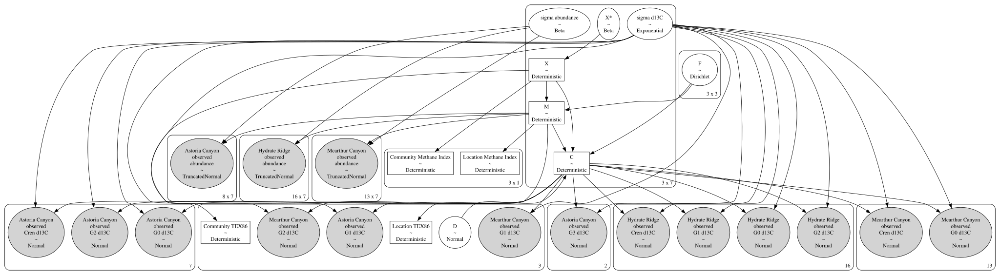

In [20]:
try:
    gv = pm.model_to_graphviz(model)
except FileNotFoundError as err:
    print(
        "The graphviz executable (`dot`) was not found. Make sure it's installed and on your system's PATH. Once it is, the model can be displayed as a directed acyclic graph (DAG)."
    )
    gv = None
gv

### prior predictive checks


In [21]:
with model:
    prior = pm.sample_prior_predictive(samples=32_000)
prior.prior.to_netcdf("../model-results/prior.nc")

Sampling: [Astoria Canyon
observed
Cren d13C, Astoria Canyon
observed
G0 d13C, Astoria Canyon
observed
G1 d13C, Astoria Canyon
observed
G2 d13C, Astoria Canyon
observed
G3 d13C, Astoria Canyon
observed
abundance, D, F, Hydrate Ridge
observed
Cren d13C, Hydrate Ridge
observed
G0 d13C, Hydrate Ridge
observed
G1 d13C, Hydrate Ridge
observed
G2 d13C, Hydrate Ridge
observed
abundance, Mcarthur Canyon
observed
Cren d13C, Mcarthur Canyon
observed
G0 d13C, Mcarthur Canyon
observed
G1 d13C, Mcarthur Canyon
observed
G2 d13C, Mcarthur Canyon
observed
abundance, X*, sigma abundance, sigma d13C]


<Figure size 960x720 with 0 Axes>

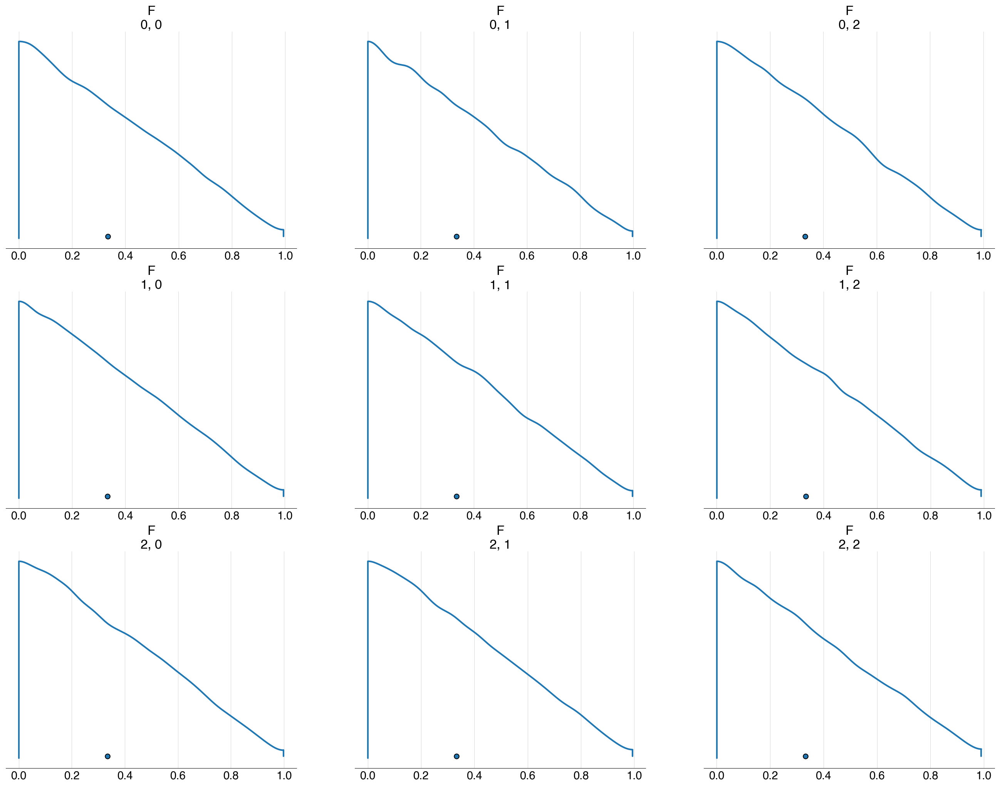

In [22]:
fig = plt.figure()
az.plot_density(prior.prior, var_names="F", hdi_prob=1, grid=(3, 3))
fig.tight_layout()

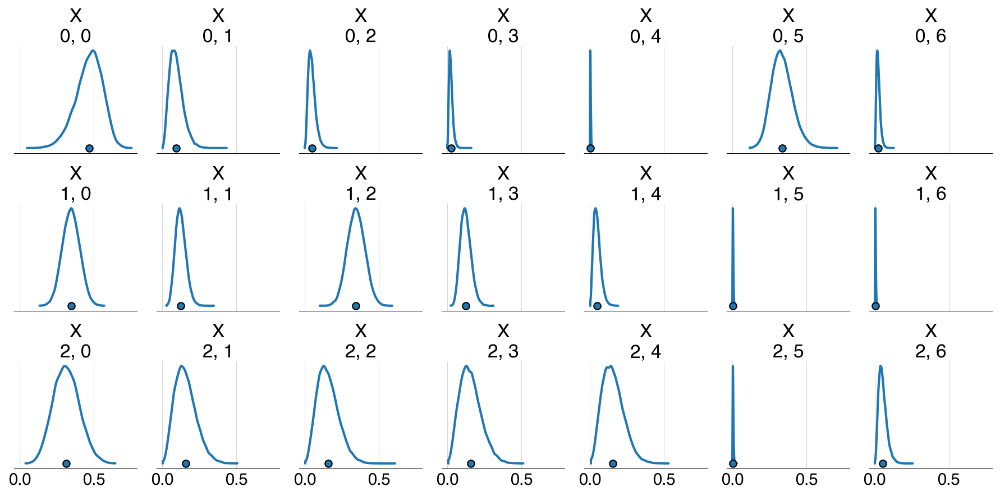

In [23]:
fig, axs = plt.subplots(3, 7, figsize=(12, 6), sharex=True)
az.plot_density(prior.prior, var_names="X", hdi_prob=1, ax=axs)
fig.tight_layout()

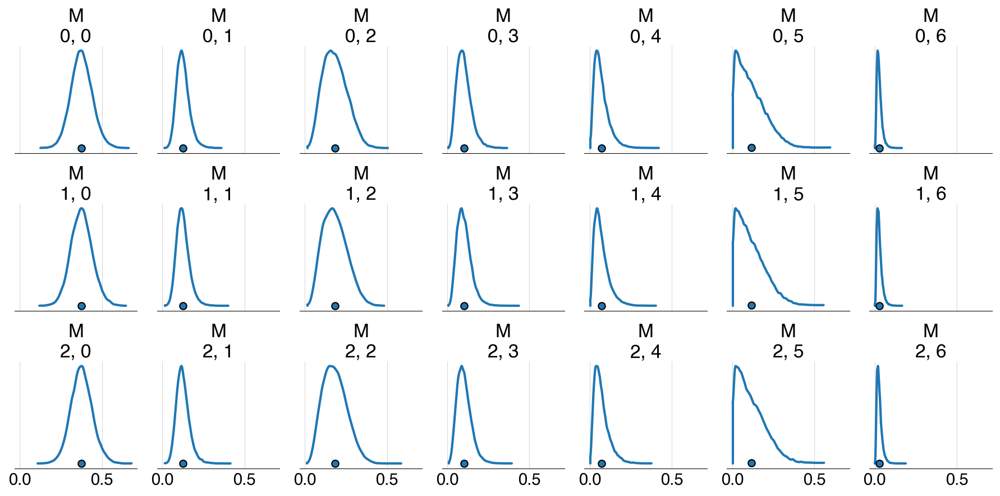

In [24]:
fig, axs = plt.subplots(3, 7, figsize=(12, 6), sharex=True)
az.plot_density(prior.prior, var_names="M", hdi_prob=1, ax=axs)
fig.tight_layout()

<Figure size 960x720 with 0 Axes>

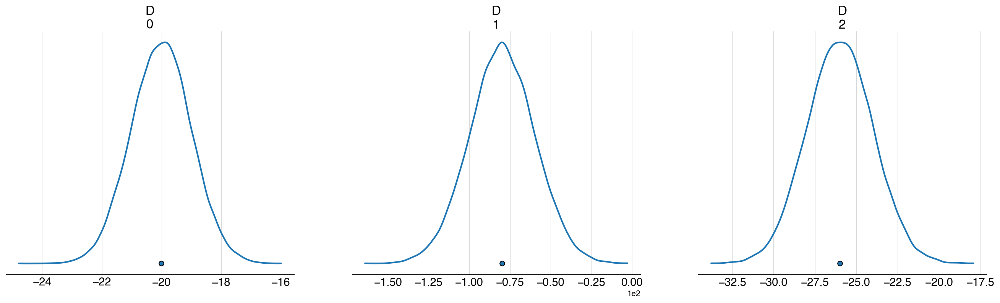

In [25]:
fig = plt.figure()
az.plot_density(prior.prior, var_names="D", hdi_prob=1)
fig.tight_layout()

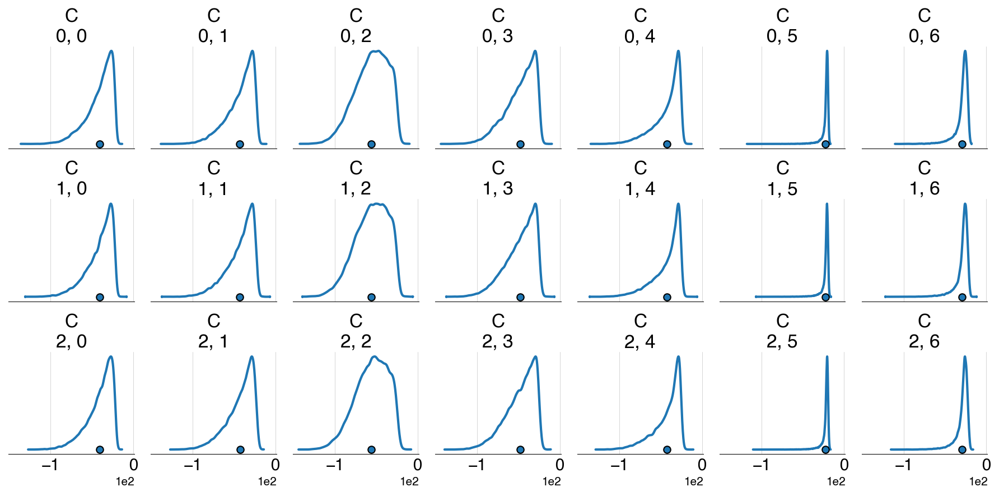

In [26]:
fig, axs = plt.subplots(3, 7, figsize=(12, 6), sharex=True)
az.plot_density(prior.prior, var_names="C", hdi_prob=1, ax=axs)
fig.tight_layout()

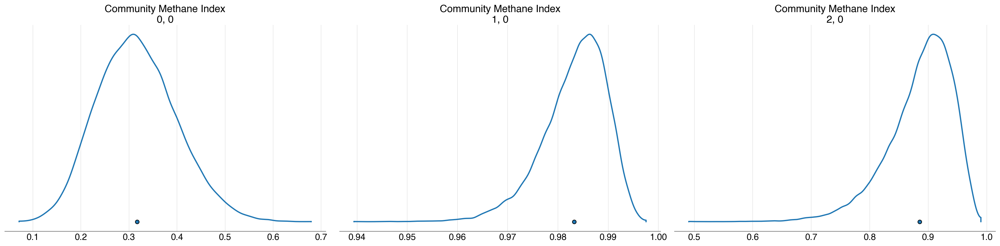

In [27]:
az.plot_density(prior.prior, var_names="Community Methane Index", hdi_prob=1)
plt.gcf().tight_layout()

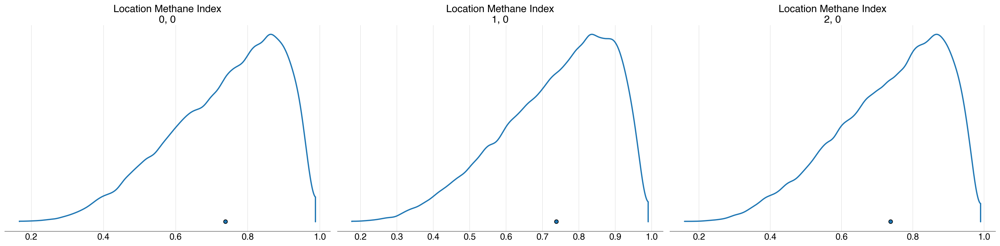

In [28]:
az.plot_density(prior.prior, var_names="Location Methane Index", hdi_prob=1)
plt.gcf().tight_layout()

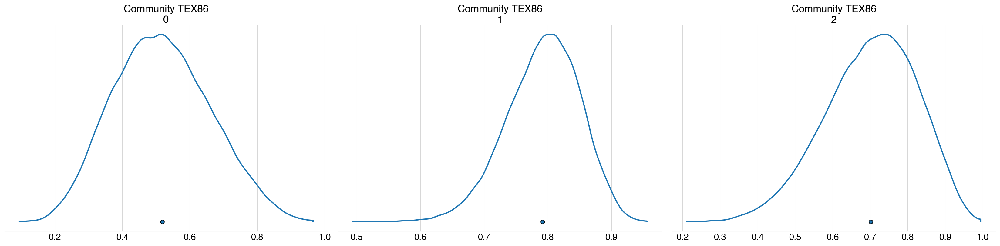

In [29]:
az.plot_density(prior.prior, var_names="Community TEX86", hdi_prob=1)
plt.gcf().tight_layout()

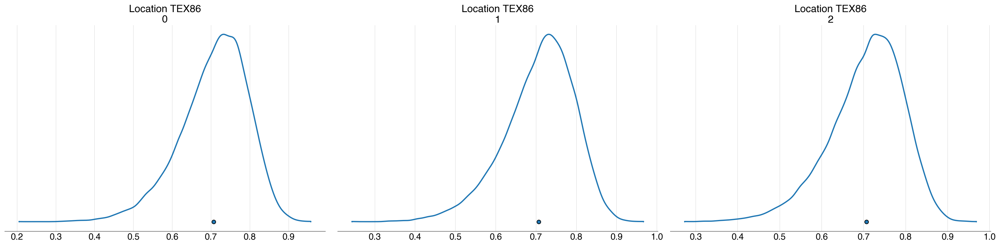

In [30]:
az.plot_density(prior.prior, var_names="Location TEX86", hdi_prob=1)
plt.gcf().tight_layout()

### posterior sampling


In [31]:
with model:
    post = pm.sample(cores=16, chains=16, tune=4_000, draws=4_000, target_accept=0.975)
post.posterior.to_netcdf("../model-results/posterior.nc")

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (16 chains in 16 jobs)
NUTS: [F, X*, sigma abundance, D, sigma d13C]


Output()

Sampling 16 chains for 4_000 tune and 4_000 draw iterations (64_000 + 64_000 draws total) took 524 seconds.


### posterior checks


### rhat


In [32]:
rhat = az.rhat(post)

In [33]:
rhat["F"]

<xarray.DataArray 'F' (F_dim_0: 3, F_dim_1: 3)> Size: 72B
array([[1.00007573, 1.00001223, 1.00002254],
       [1.00001928, 1.0000351 , 1.00008384],
       [1.00022038, 1.00010487, 1.0003354 ]])
Coordinates:
  * F_dim_0  (F_dim_0) int64 24B 0 1 2
  * F_dim_1  (F_dim_1) int64 24B 0 1 2

In [34]:
rhat["X"]

<xarray.DataArray 'X' (X_dim_0: 3, X_dim_1: 7)> Size: 168B
array([[1.00007143, 1.00011335, 1.00006198, 1.00017465, 1.00043933,
        1.00029028, 1.00017537],
       [1.0002085 , 1.00001368, 1.00020116, 1.0001486 , 0.999997  ,
        1.00008163, 1.00017481],
       [1.00034086, 1.00035363, 1.00016609, 1.00002985, 1.00014481,
        1.00020852, 1.00021672]])
Coordinates:
  * X_dim_0  (X_dim_0) int64 24B 0 1 2
  * X_dim_1  (X_dim_1) int64 56B 0 1 2 3 4 5 6

In [35]:
rhat["D"]

<xarray.DataArray 'D' (D_dim_0: 3)> Size: 24B
array([1.00027633, 1.00005801, 1.00029481])
Coordinates:
  * D_dim_0  (D_dim_0) int64 24B 0 1 2

#### ESS


In [36]:
ess = az.ess(post)

In [37]:
ess["F"]

<xarray.DataArray 'F' (F_dim_0: 3, F_dim_1: 3)> Size: 72B
array([[73042.41156489, 64901.4537222 , 35727.48361396],
       [61585.50856141, 62712.8232003 , 43003.3839519 ],
       [26286.48466606, 55683.67004243, 22202.44605112]])
Coordinates:
  * F_dim_0  (F_dim_0) int64 24B 0 1 2
  * F_dim_1  (F_dim_1) int64 24B 0 1 2

In [38]:
ess["X"]

<xarray.DataArray 'X' (X_dim_0: 3, X_dim_1: 7)> Size: 168B
array([[ 69957.64353527,  50591.6573212 ,  58417.92535809,
         50296.50283862,  94378.5774978 ,  30542.79400273,
         25731.07927893],
       [102554.6744819 ,  82511.07669881,  92389.55204061,
         92938.52372479,  96195.27156508, 100047.77129571,
         91641.80702441],
       [103962.39422876, 105857.03919671, 101033.19656848,
         56247.61657853,  44293.98748111, 121896.67923025,
         37622.40424997]])
Coordinates:
  * X_dim_0  (X_dim_0) int64 24B 0 1 2
  * X_dim_1  (X_dim_1) int64 56B 0 1 2 3 4 5 6

In [39]:
ess["D"]

<xarray.DataArray 'D' (D_dim_0: 3)> Size: 24B
array([ 82709.73930871,  52031.77612034, 144076.51715217])
Coordinates:
  * D_dim_0  (D_dim_0) int64 24B 0 1 2

#### traces


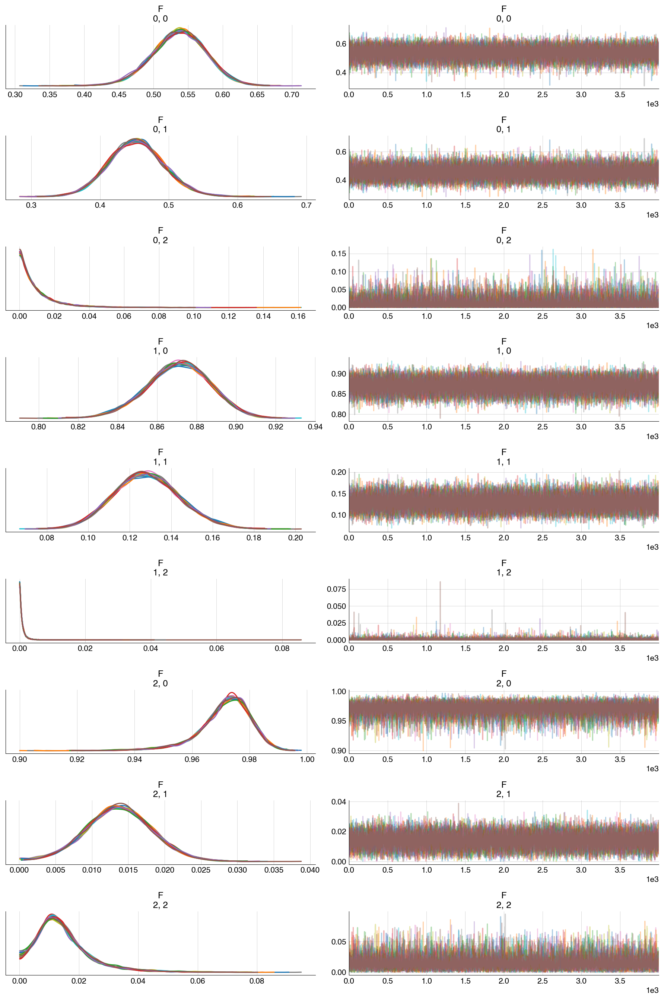

In [40]:
az.plot_trace(post, var_names=["F"], compact=False)
plt.gcf().tight_layout()

/Users/markbaum/Documents/projects/cascadia-margin-lipids/.venv/lib/python3.11/site-packages/arviz/plots/traceplot.py:223: UserWarning: rcParams['plot.max_subplots'] (20) is smaller than the number of variables to plot (21), generating only 20 plots
  warnings.warn(


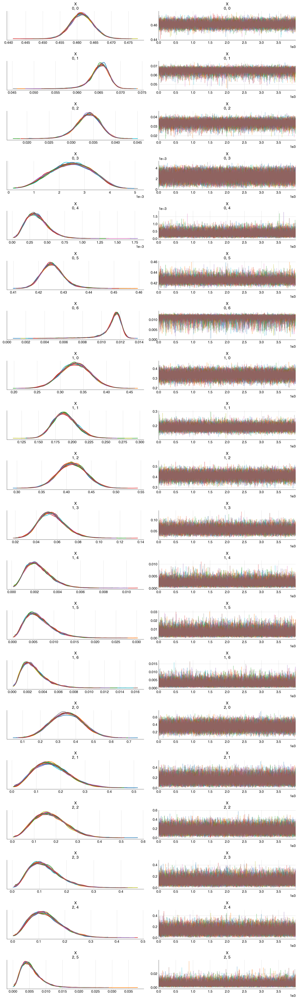

In [41]:
az.plot_trace(post, var_names="X", compact=False)
plt.gcf().tight_layout()

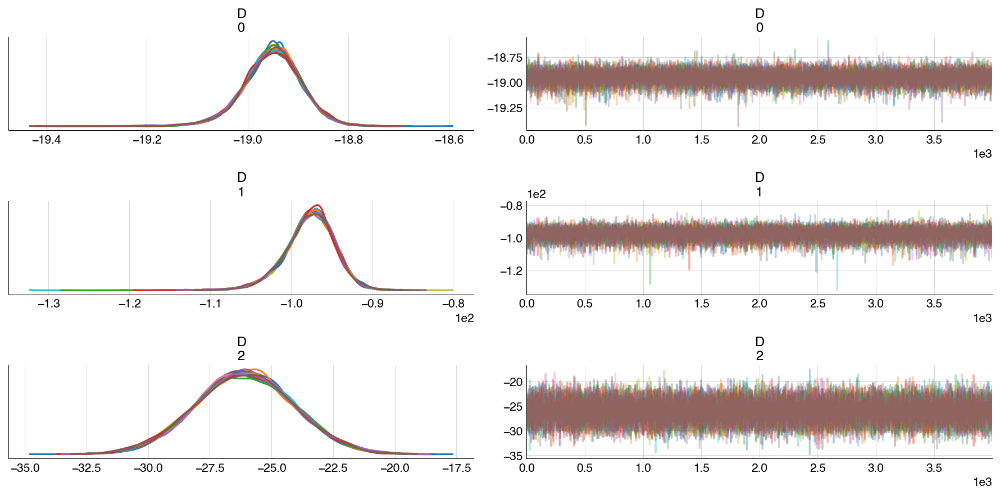

In [42]:
az.plot_trace(post, var_names=["D"], compact=False)
plt.gcf().tight_layout()

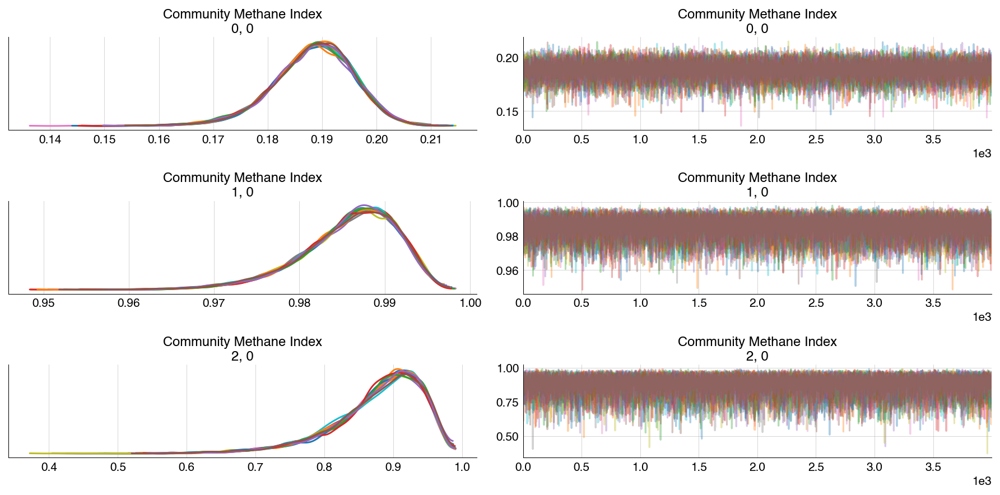

In [43]:
az.plot_trace(post, var_names=["Community Methane Index"], compact=False)
plt.gcf().tight_layout()

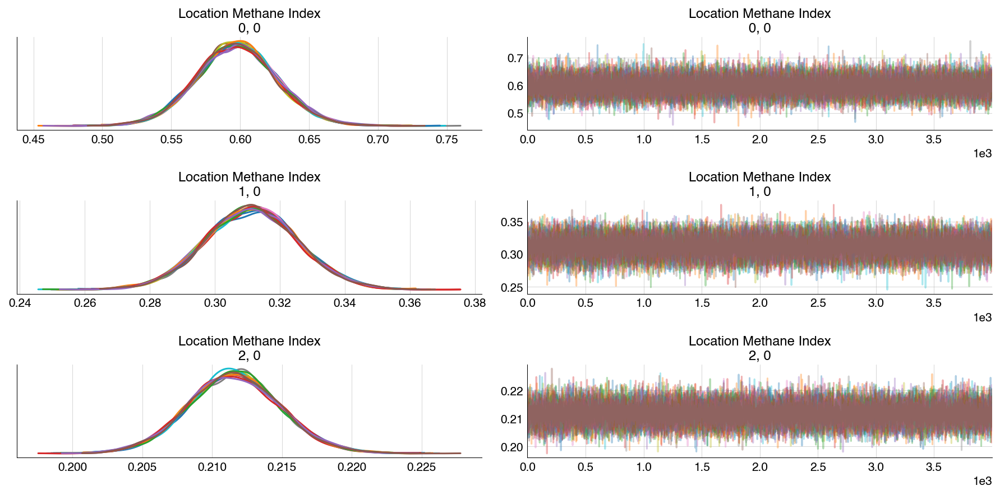

In [44]:
az.plot_trace(post, var_names=["Location Methane Index"], compact=False)
plt.gcf().tight_layout()

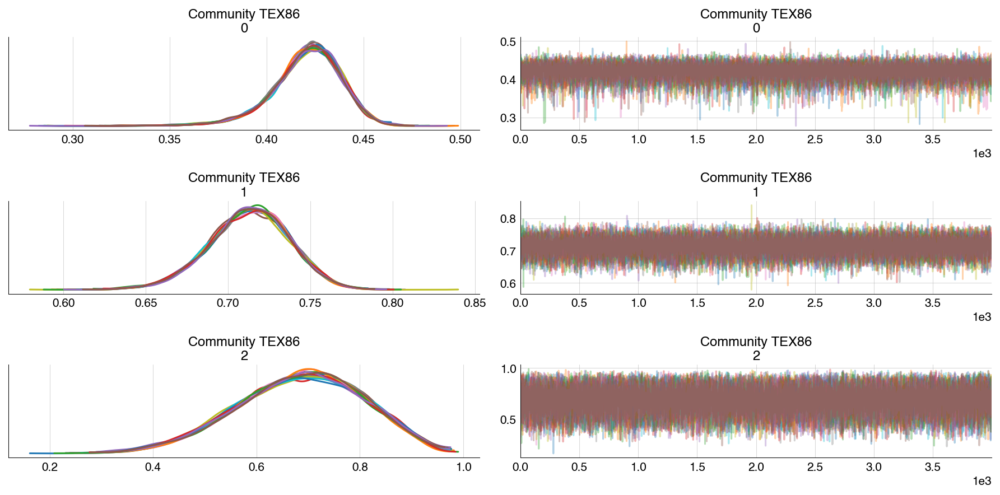

In [45]:
az.plot_trace(post, var_names=["Community TEX86"], compact=False)
plt.gcf().tight_layout()

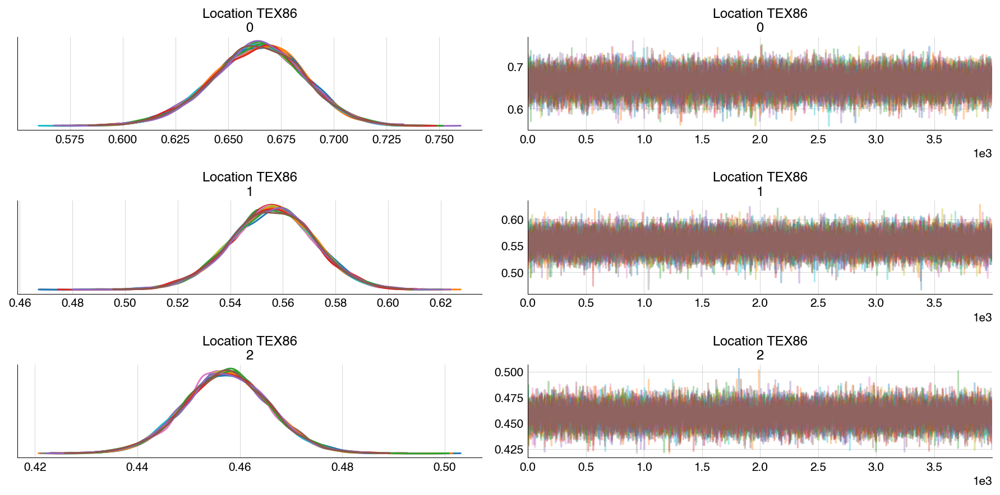

In [46]:
az.plot_trace(post, var_names=["Location TEX86"], compact=False)
plt.gcf().tight_layout()

### posterior predictive


In [47]:
with model:
    ppc = pm.sample_posterior_predictive(post)
ppc.posterior_predictive.to_netcdf("../model-results/posterior_predictive.nc")

Sampling: [Astoria Canyon
observed
Cren d13C, Astoria Canyon
observed
G0 d13C, Astoria Canyon
observed
G1 d13C, Astoria Canyon
observed
G2 d13C, Astoria Canyon
observed
G3 d13C, Astoria Canyon
observed
abundance, Hydrate Ridge
observed
Cren d13C, Hydrate Ridge
observed
G0 d13C, Hydrate Ridge
observed
G1 d13C, Hydrate Ridge
observed
G2 d13C, Hydrate Ridge
observed
abundance, Mcarthur Canyon
observed
Cren d13C, Mcarthur Canyon
observed
G0 d13C, Mcarthur Canyon
observed
G1 d13C, Mcarthur Canyon
observed
G2 d13C, Mcarthur Canyon
observed
abundance]


Output()

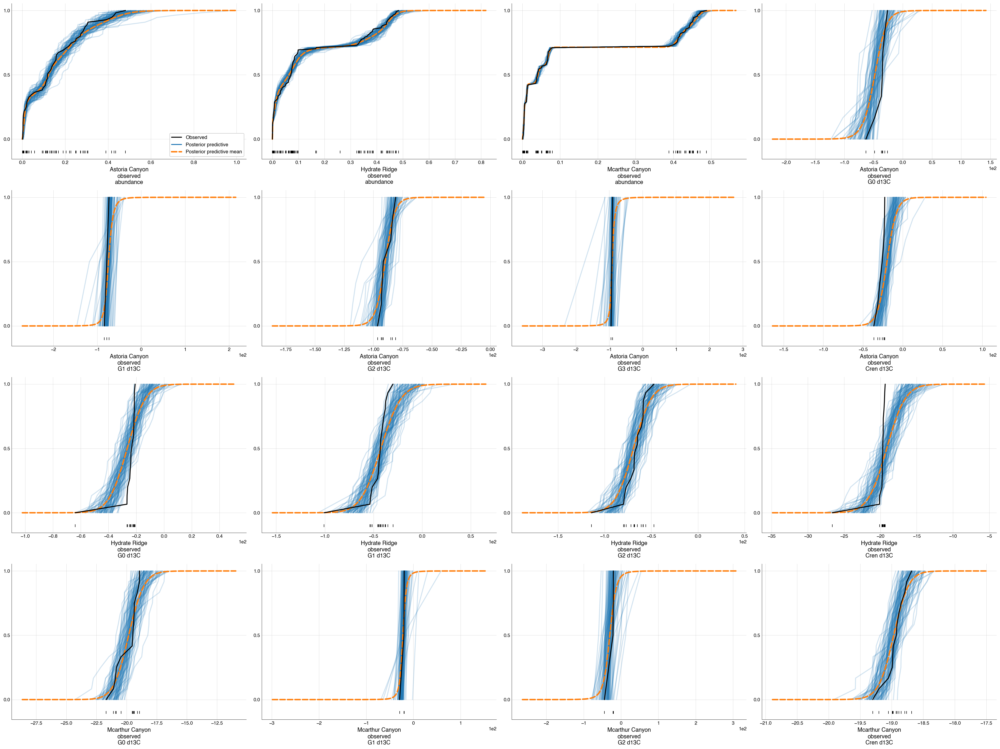

In [48]:
az.plot_ppc(ppc, num_pp_samples=100, observed_rug=True, kind="cumulative")
plt.gcf().tight_layout()